<>:14: SyntaxWarning: invalid escape sequence '\C'
<>:14: SyntaxWarning: invalid escape sequence '\C'
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_9480\1372126885.py:14: SyntaxWarning: invalid escape sequence '\C'
  df = pd.read_csv('D:\COSC2753_A2_MachineLearning\meta_train.csv')
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_9480\1372126885.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=label_counts.index, y=label_counts.values, palette="viridis")
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_9480\1372126885.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=variety_counts.index, y=variety_counts.values, palette="magma")


Insight: Class imbalance detected - consider oversampling or class weighting.
Insight: Dominant varieties may influence disease patterns.
Insight: Age peaks suggest maturity stage impacts data.
Insight: Variety-specific disease patterns detected.


C:\Users\LENOVO\AppData\Local\Temp\ipykernel_9480\1372126885.py:59: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='label', y='age', data=df, palette="Set2")


Insight: Age varies across diseases - potential feature for modeling.
Insight: Visual markers (e.g., lesions) guide preprocessing.


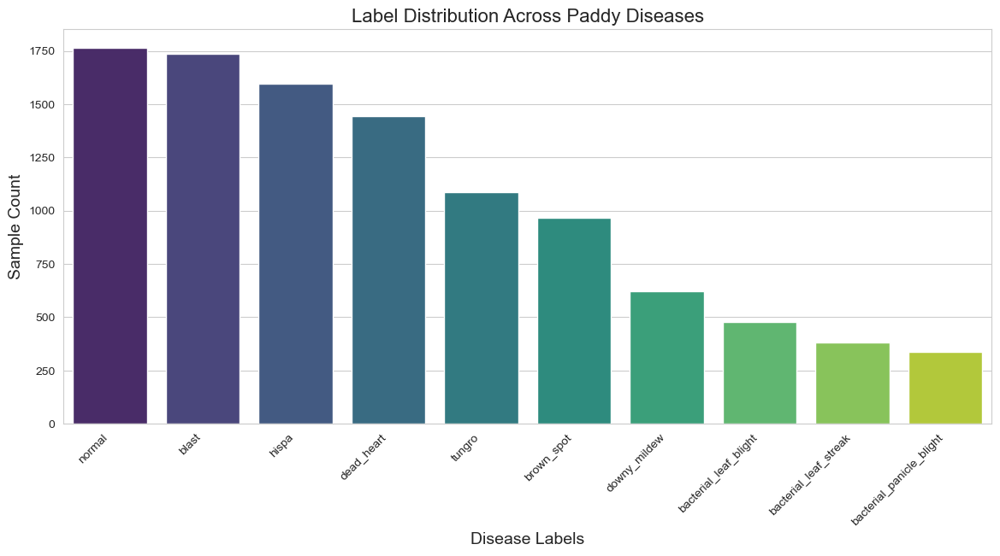

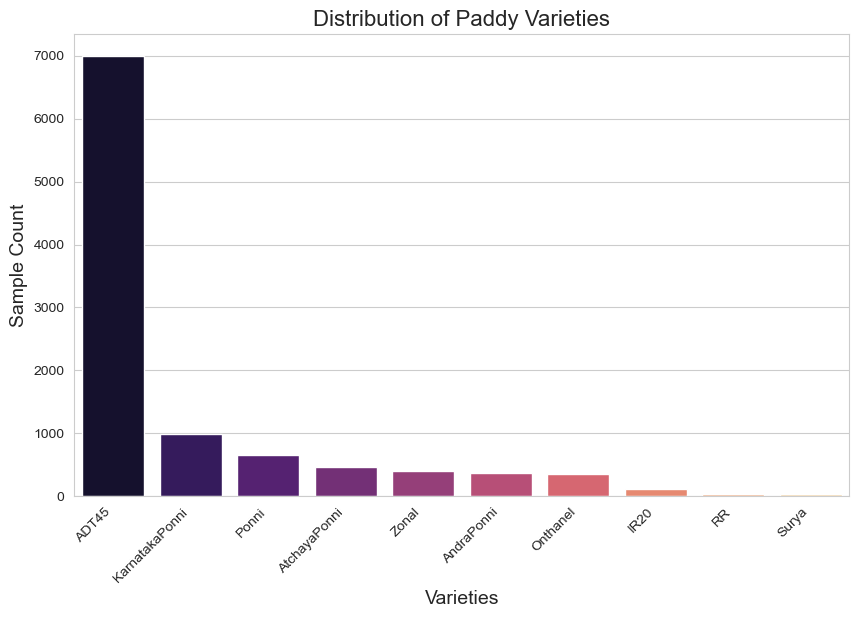

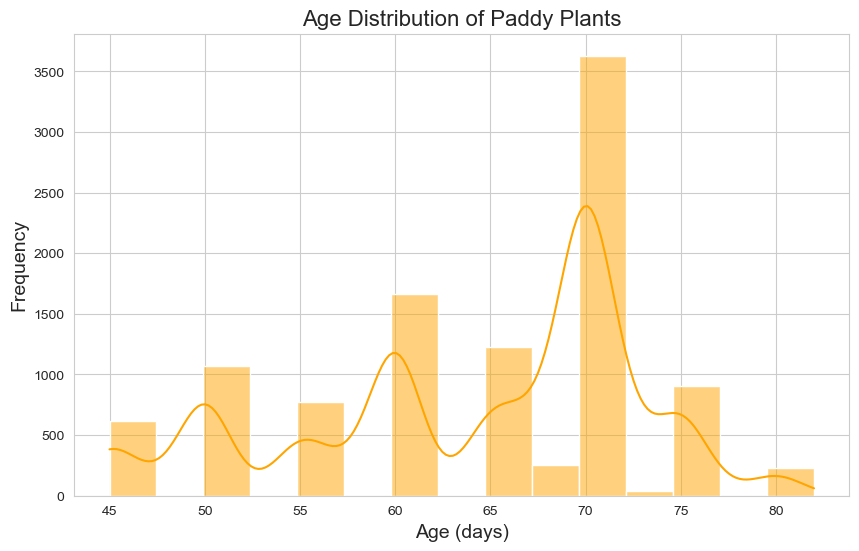

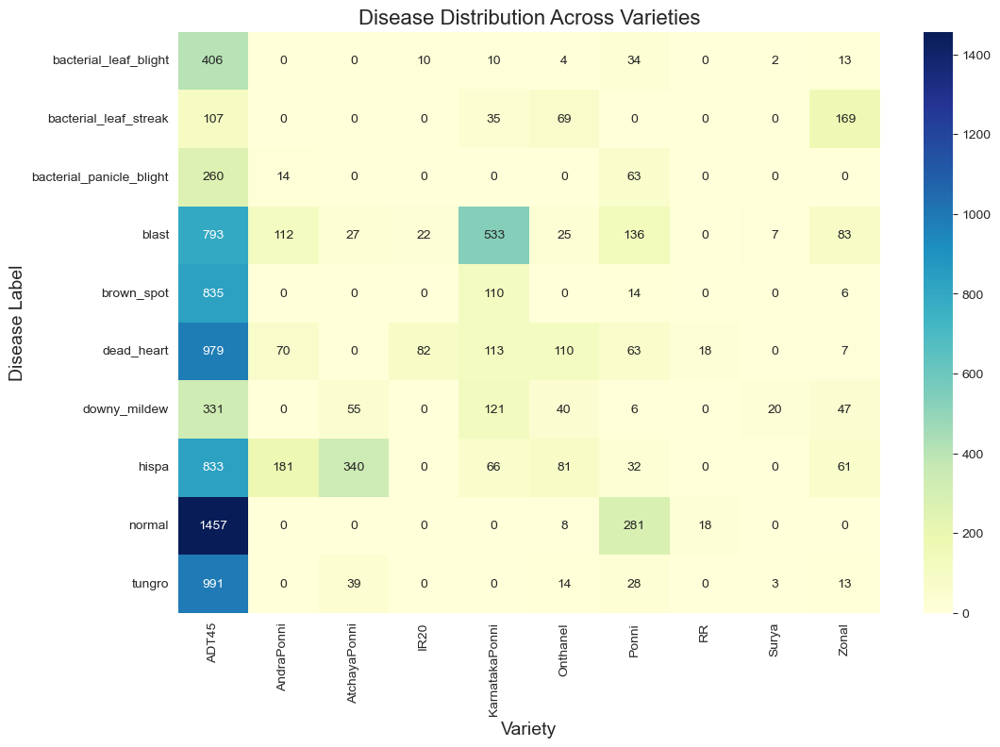

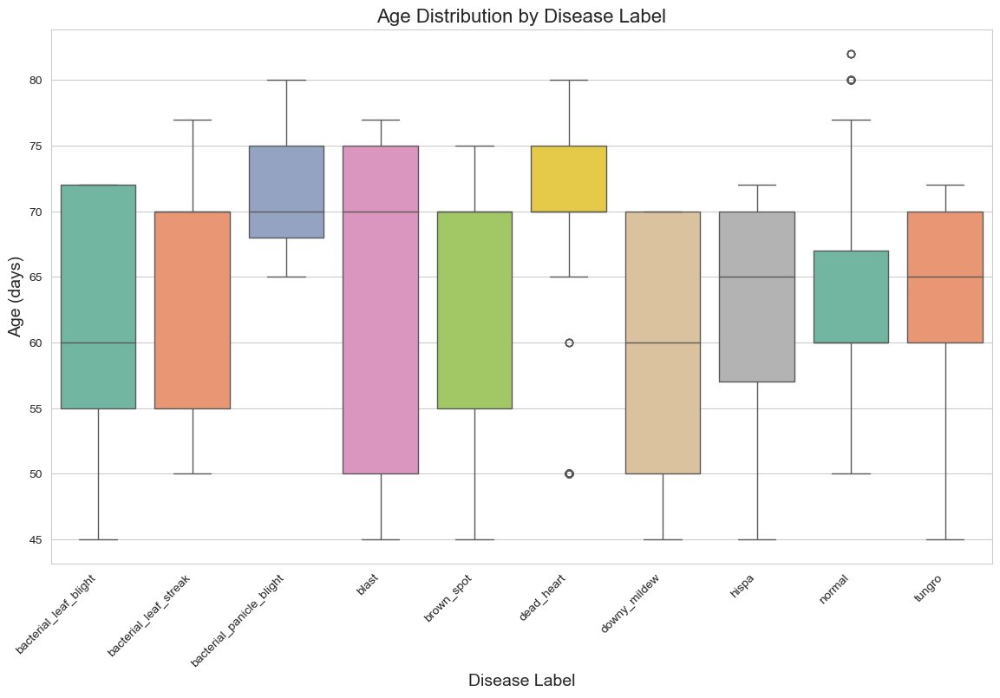

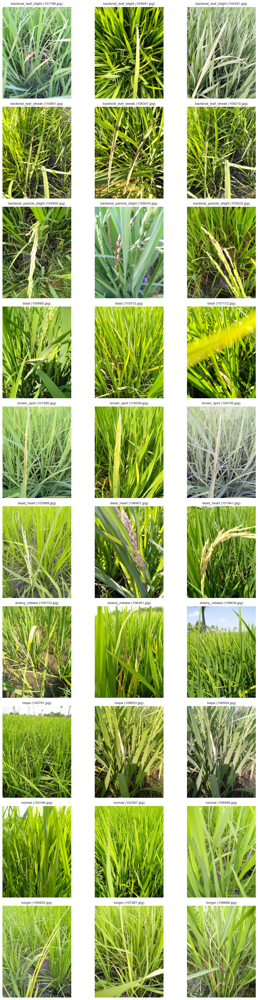

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from PIL import Image
import random
import os

# Set plot style for clarity and aesthetics
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (12, 8)

# Load dataset (adjust path as needed)
df = pd.read_csv('D:\COSC2753_A2_MachineLearning\meta_train.csv')

# 1. Label Distribution Analysis
label_counts = df['label'].value_counts()
plt.figure(figsize=(14, 6))
sns.barplot(x=label_counts.index, y=label_counts.values, palette="viridis")
plt.title('Label Distribution Across Paddy Diseases', fontsize=16)
plt.xlabel('Disease Labels', fontsize=14)
plt.ylabel('Sample Count', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.savefig('label_distribution.png')
print("Insight: Class imbalance detected - consider oversampling or class weighting.")

# 2. Variety Distribution Analysis
variety_counts = df['variety'].value_counts()
plt.figure(figsize=(10, 6))
sns.barplot(x=variety_counts.index, y=variety_counts.values, palette="magma")
plt.title('Distribution of Paddy Varieties', fontsize=16)
plt.xlabel('Varieties', fontsize=14)
plt.ylabel('Sample Count', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.savefig('variety_distribution.png')
print("Insight: Dominant varieties may influence disease patterns.")

# 3. Age Distribution Analysis
plt.figure(figsize=(10, 6))
sns.histplot(df['age'], bins=15, kde=True, color='orange')
plt.title('Age Distribution of Paddy Plants', fontsize=16)
plt.xlabel('Age (days)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.savefig('age_distribution.png')
print("Insight: Age peaks suggest maturity stage impacts data.")

# 4. Label-Variety Relationship (Heatmap)
label_variety = pd.crosstab(df['label'], df['variety'])
plt.figure(figsize=(12, 8))
sns.heatmap(label_variety, cmap="YlGnBu", annot=True, fmt='d')
plt.title('Disease Distribution Across Varieties', fontsize=16)
plt.xlabel('Variety', fontsize=14)
plt.ylabel('Disease Label', fontsize=14)
plt.savefig('label_variety_heatmap.png')
print("Insight: Variety-specific disease patterns detected.")

# 5. Age by Label Analysis (Box Plot)
plt.figure(figsize=(14, 8))
sns.boxplot(x='label', y='age', data=df, palette="Set2")
plt.title('Age Distribution by Disease Label', fontsize=16)
plt.xlabel('Disease Label', fontsize=14)
plt.ylabel('Age (days)', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.savefig('age_by_label.png')
print("Insight: Age varies across diseases - potential feature for modeling.")

# 6. Sample Image Visualization
image_dir = r'D:\COSC2753_A2_MachineLearning\train_images'
unique_labels = df['label'].unique()
samples_per_label = 3

fig, axes = plt.subplots(len(unique_labels), samples_per_label, figsize=(samples_per_label * 4, len(unique_labels) * 4))
for i, label in enumerate(unique_labels):
    label_images = df[df['label'] == label]['image_id'].tolist()
    selected_images = random.sample(label_images, min(samples_per_label, len(label_images)))
    for j, image_id in enumerate(selected_images):
        img_path = os.path.join(image_dir, label, image_id)
        try:
            img = Image.open(img_path)
            axes[i, j].imshow(img)
            axes[i, j].set_title(f"{label} ({image_id})", fontsize=10)
            axes[i, j].axis('off')
        except Exception as e:
            axes[i, j].set_title(f"{label} (Load Error)", fontsize=10)
            axes[i, j].axis('off')
plt.tight_layout()
plt.savefig('sample_images.png')
print("Insight: Visual markers (e.g., lesions) guide preprocessing.")